TODO:

- DONE Convert geometry of listed to match lon, lat
- DONE Get conversion from LGD to postcode for price changes
- Identify converted house/flats as area may be misleading?
- Get geojsons for LSOA or something and aggregate postcodes to that
  - Small Areas may be better; 4500 of them https://www.opendatani.gov.uk/blog/data-aggregation-levels-of-geography-in-ni
  - 890 SOAs

There is more price data available here https://www.opendatani.gov.uk/dataset/northern-ireland-annual-descriptive-house-price-statistics-lgd-level
- It is year-LGD summarised sales data including number of sales, max price etc, and split by property type, up to 2021
- We have that from LGD 2022 already, but splitting by prop type could add something to price factors
- Or could have an option to go to any year in 2005-2022

Postcode data of some kind https://geoportal.statistics.gov.uk/datasets/national-statistics-postcode-lookup-2021-census-august-2022/about
- No postcode boundaries
- Included in Documents/ is LSOA (2011) names and codes UK as at 12_12.csv which contains NI LOASs, e.g. 95GG11S2; this matches lsoa21 in the postcode file, also in the Doogal file

Access to data is on annual license and is updated quarterly https://www.finance-ni.gov.uk/topics/property-valuation/property-data

How do they do domestic valuations? https://www.finance-ni.gov.uk/topics/property-valuation/domestic-valuation, https://www.nidirect.gov.uk/articles/valuation-domestic-properties-rates
- Assessed 'on the basis of its capital value'
- 'an understanding that all properties had an average state of internal repair and fittings, such as a standard kitchen and bathroom'
- depends on 
  - the size of the property (the external area of a house and the internal area for an apartment)
  - the type of property, such as detached, semi, terrace or apartment
  - the location of the property
  - if the property has a garage or other domestic outbuildings

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm, colors
import cartopy.crs as ccrs
import folium
import re, glob, random, copy
import geopandas

In [303]:
test_files = glob.glob('/media/shared_storage/data/ni-house-price_data/LPS_data/lps_valuations_10?????_*.csv')

houses = pd.concat([pd.read_csv(f) for f in test_files[:200]])

houses['desc'] = houses.desc.fillna('')
houses = houses[~houses.desc.str.contains('presbytery|convent|sheltered|shletered|mobile home|shop|premises|self-catering unit|'+
                                          'public house|showhouse|wardens house|community|unfinished|vacant|freestanding caravan|'+
                                          'gate lodge|gatelodge|church|wardens|vacany|room|parochial house|'+
                                          'mobile|single level self contained|caravan|carvan')].copy()
houses = houses[~houses.desc.isin(['','outbuilding','hut','houses (huts) garden','hut garden',
                                   'storage','manse','cabin','garage','store','bed & breakfast',
                                   'prefab','log cabin'])]

#Add lon, lat from Doogal postcodes 
postcodes = pd.read_csv('../text-work/mla_tweets/data/constituencies/full_postcode_latlons_from_doogal.csv', 
    usecols=['Postcode','Latitude','Longitude','LSOA Code'])
houses = houses.merge(postcodes, left_on='postcode', right_on='Postcode')

#Some postcode lon lat are 0
print(f"Dropping {(houses.Longitude==0).sum()} lon=lat=0 cases of {houses.shape[0]} total")
houses = houses[houses.Longitude != 0]

print(f"Dropping {(houses.type=='Mixed').sum()} Mixed cases")
houses = houses[houses.type=='Domestic']

#19000 is used in some suspicious cases; may be in bad disrepair or some other situation
print(f'Dropping {(houses.value==19000).sum()} cases of £19,000')
houses = houses[houses.value!=19000]

#Drop very big ones which would stretch a linear ppsqm fit or be not normal houses
print(f'Dropping {(houses.area_m2>800).sum()} cases bigger than 800m^2')
houses = houses[houses.area_m2<=800]

houses = houses.copy().set_index('id')

houses.tail()

Dropping 578 lon=lat=0 cases of 80169 total
Dropping 75 Mixed cases
Dropping 0 cases of £19,000
Dropping 56 cases bigger than 800m^2


,address,postcode,type,desc,value,area_m2,has_garage,Postcode,Latitude,Longitude,LSOA Code
id,,,,,,,,,,,
1068973,"38 Cooneen Road,Breakly,Fivemiletown,Fivemilet...",BT75 0NF,Domestic,house agricultural,160000.0,268.2,No,BT75 0NF,54.363913,-7.305915,95PP05W1
1068993,"APARTMENT 1 4 Loughan Hall,Church Quarter,Gra...",BT16 2FR,Domestic,apartment (ground floor),100000.0,55.7,No,BT16 2FR,54.590884,-5.807920,95II13W1
1068996,"APARTMENT 2 4 Loughan Hall,Church Quarter,Gra...",BT16 2FR,Domestic,apartment (ground floor),100000.0,55.7,No,BT16 2FR,54.590884,-5.807920,95II13W1
1068997,"APARTMENT 3 4 Loughan Hall,Church Quarter,Gra...",BT16 2FR,Domestic,apartment (1st floor),100000.0,54.2,No,BT16 2FR,54.590884,-5.807920,95II13W1
1068998,"APARTMENT 4 4 Loughan Hall,Church Quarter,Gra...",BT16 2FR,Domestic,apartment (1st floor),100000.0,54.2,No,BT16 2FR,54.590884,-5.807920,95II13W1


## Check data

In [304]:
print(f'Dropping {len(houses[houses.area_m2 <= 10])} records with <=10 m^2 area')
houses = houses[houses.area_m2 > 2].copy()

#A few more look dodgy in size and/or value, or may be a non-house
houses = houses[~houses.index.isin([217637,207728,227086,249727,279559,241819,283490,283752,
                                    244679,166273,290979,164369,177058,145552,147965,195652,
                                    124847,138233,116652,145536, 84213,113324, 89525, 66628,
                                     64802, 85170,200077, 63280])].copy()

#Some look like typos for area
houses['area_m2'] = houses.apply(lambda row: 41 if row.name==201786 else row['area_m2'], axis=1)
houses['area_m2'] = houses.apply(lambda row: 61 if row.name==204122 else row['area_m2'], axis=1)
houses['area_m2'] = houses.apply(lambda row: 61 if row.name==204152 else row['area_m2'], axis=1)
houses['area_m2'] = houses.apply(lambda row: 53 if row.name==204122 else row['area_m2'], axis=1)
houses['area_m2'] = houses.apply(lambda row: 53 if row.name==204152 else row['area_m2'], axis=1)
houses['area_m2'] = houses.apply(lambda row: 110 if row.name in [260850,260849,260848,260846] else row['area_m2'], axis=1)  #map shows 110 but prop pages show 11
houses['area_m2'] = houses.apply(lambda row: 93 if row.name==291239 else row['area_m2'], axis=1)  #not 963
houses['area_m2'] = houses.apply(lambda row: 81 if row.name==251067 else row['area_m2'], axis=1)  #not 810
houses['area_m2'] = houses.apply(lambda row: 106 if row.name==242378 else row['area_m2'], axis=1)  #not 1006
houses['area_m2'] = houses.apply(lambda row: 78.9 if row.name==188692 else row['area_m2'], axis=1)  #probably, not 789
houses['area_m2'] = houses.apply(lambda row: 45.8 if row.name==181623 else row['area_m2'], axis=1)  #not 458
houses['area_m2'] = houses.apply(lambda row: 86 if row.name==246832 else row['area_m2'], axis=1)  #ish, not 23
houses['area_m2'] = houses.apply(lambda row: 118.15 if row.name==144572 else row['area_m2'], axis=1)  #this is the value in the map view
houses['area_m2'] = houses.apply(lambda row: 94 if row.name==153232 else row['area_m2'], axis=1)  #probably two 47s
houses['area_m2'] = houses.apply(lambda row: 97 if row.name==153177 else row['area_m2'], axis=1)  #probably two 48.5s
houses['area_m2'] = houses.apply(lambda row: 96 if row.name==159505 else row['area_m2'], axis=1)  #probably two 48s
houses['area_m2'] = houses.apply(lambda row: 47 if row.name==2000077 else row['area_m2'], axis=1)  #probably, not 17 (over 2 floors) as more expensive than a 43m2
houses['area_m2'] = houses.apply(lambda row: 99 if row.name==99782 else row['area_m2'], axis=1)  #not 19
houses['area_m2'] = houses.apply(lambda row: 98 if row.name==109693 else row['area_m2'], axis=1)  #probably two 49s
houses['area_m2'] = houses.apply(lambda row: 92 if row.name==89430 else row['area_m2'], axis=1)  #probably two 46s
houses['area_m2'] = houses.apply(lambda row: 68 if row.name==89043 else row['area_m2'], axis=1)  #probably two 34s
houses['area_m2'] = houses.apply(lambda row: 94 if row.name==88844 else row['area_m2'], axis=1)  #probably two 47s

houses['value'] = houses.apply(lambda row: 1000000 if row.name==243125 else row['value'], axis=1)  #change 64 from 100k; 62 nearby is 1m
houses['value'] = houses.apply(lambda row: 190000 if row.name==207581 else row['value'], axis=1)  #probably, not 19,000
houses['value'] = houses.apply(lambda row: 95000 if row.name==194274 else row['value'], axis=1)  #probably, not 19,500


Dropping 7 records with <=10 m^2 area


In [305]:
#Suspiciously small flats - maybe as small as 10m2 is plausible

houses[(houses.area_m2 < 20) & (houses.value/houses.area_m2 > 3000)].assign(ppsqm = lambda df: df.value/df.area_m2).sort_values('ppsqm', ascending=False)

,address,postcode,type,desc,value,area_m2,has_garage,Postcode,Latitude,Longitude,LSOA Code,ppsqm
id,,,,,,,,,,,,


In [306]:
#Suspiciously small houses

houses[(houses.desc.str.contains('house')) & (houses.area_m2 < 50) & (houses.value/houses.area_m2 > 2000)]\
    .assign(ppsqm = lambda df: df.value/df.area_m2).sort_values('ppsqm', ascending=False)\
    .query("id not in [199015, 196183, 153043, 162639, 162640]")

#199015, 196183, 153043, 162639, 162640 are probably OK

,address,postcode,type,desc,value,area_m2,has_garage,Postcode,Latitude,Longitude,LSOA Code,ppsqm
id,,,,,,,,,,,,
1078298,"(1) 118C Princetown Road,Corporation,Harbour,...",BT20 3TG,Domestic,house yard,80000.0,34.2,No,BT20 3TG,54.665943,-5.678053,95XX21W1,2339.181287


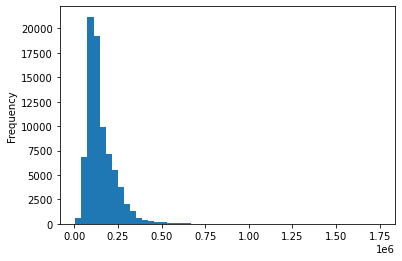

In [307]:
houses.value.plot.hist(bins=50);

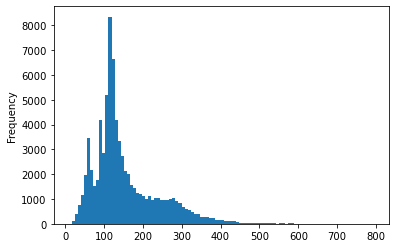

In [308]:
houses.area_m2.plot.hist(bins=100);

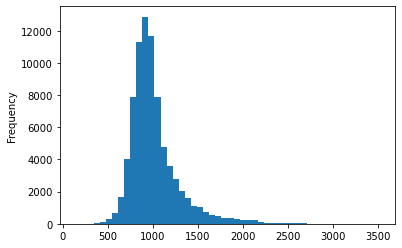

In [309]:
houses['price_per_sq_m'] = houses.value/houses.area_m2

houses['price_per_sq_m'].plot.hist(bins=50);

In [310]:
print(f'Dropping {len(houses[(houses.value <= 10000) & (houses.price_per_sq_m < 100)])} cases with value a few thousand')
houses = houses[~((houses.value <= 10000) & (houses.price_per_sq_m < 100))].copy()


Dropping 0 cases with value a few thousand


In [311]:
#Other unusually cheap or expensive ppsqm
#Most of the 150-300 ppsqms are double entries on the map which look suspicious 
#  but it's not obvious what the error is, so leave them in

houses[((houses.price_per_sq_m < 250) | (houses.price_per_sq_m > 5000)) &
       (~houses.index.isin([166509,205738,210443,186320,168917,164337,177729,147608,71116,72135]))]\
    [['address','postcode','desc','value','area_m2','price_per_sq_m']].sort_values('price_per_sq_m')

#These are OK (some are big, may not be normal houses):
#166509
#205738
#210443 probably (maybe in bad state)
#186320
#168917 probably (maybe in bad state)
#164337
#177729 probably (may be related to church)
#147608 probably (maybe in bad state)
#71116
#72135

,address,postcode,desc,value,area_m2,price_per_sq_m
id,,,,,,
1020897,"53 Ballagh Road,Ballaghanery Upper,Annalong,Ne...",BT33 0LA,house garden,5000.0,36.0,138.888889
1077379,"15B Carrickasticken Road,Carrickastickan,Forkh...",BT35 9RJ,house garden,8000.0,37.5,213.333333
1065853,"236 Legahory Court,Legaghory,Brownlow,Craigavo...",BT65 5DH,house garden,22000.0,98.2,224.032587
1066242,"237 Legahory Court,Legaghory,Brownlow,Craigavo...",BT65 5DH,house garden,22000.0,98.2,224.032587
1040944,"125 Legahory Court,Legaghory,Brownlow,Craigavo...",BT65 5DF,house garden,22000.0,96.0,229.166667
1075967,"85B Longstone Road,Moneydorragh Beg,Annalong,A...",BT34 4UZ,house garden,20000.0,81.5,245.398773


In [312]:
#Just drop ppsq < 200

houses = houses[houses.price_per_sq_m > 200].copy()

In [313]:
#desc can be 
# - 'outbuilding', e.g. lock up garage, exclude
# - 'house garden', 'house yard', 'house outbuilding garden', etc.
#    Probably call all houses
# - 'flat (1st floor)', 'flat (1st floor) car park spac', 'flat <6th>', and odd others
# - '& o' for flat means has outbuilding I think
# - 'h os g y' means house outbuildings garden yard' I presume

#houses.desc.value_counts()

In [314]:
def convert_desc_to_home_type(desc_string):
    if 'house' in desc_string:
        return 'House'
    elif desc_string[:2] in ['h ','h(','hg','ho','h+','h&','h/','h.','h0','hy','h<','h,','hs','h[','h{']:
        return 'House'
    elif desc_string in ['bungalow','cottage','h','ouse outbuilding garden','shouse outbuildings garden',
                         'hag','hag o',"h's o g",'hp & g','1st & 2nd floor house','use outbuilding garden']:
        return 'House'
    elif re.search('maisonette|farmhouse|detached rural dwelling|chalet|cottage|townhouse|bungalow|converted barn|converted outbuilding|'+
                   'huose|hiuse|huse|nouse|hiouse|hpuse', desc_string):
        return 'House'
    elif re.search('flat|flt|falt|flaat|fla t|glat|flct|flst|bedsit|penthouse|'+
                   'apartment|appartment|apart|apt|aparment|app|a\[artment|aparatment|apar|aoartment|aartment|aprtment|apatrtment|apratment|'+
                   'flast |flzt |flar |room |rm |rooms |fl 1st|flay |fla\(1st\)|fla gd|fat|flag|first \(first floor\)|'+
                   'lat \(1st floor\)|f;at \(1st floor\)', desc_string):
        return 'Flat'
    elif desc_string in ['<1st>','app','1lat (1st)','1f app','app(gf)']:
        return 'Flat'
    else:
        return 'Other'
    
def get_flat_floor_from_desc(desc_string):
    if 'house' in desc_string or desc_string[:2] in ['h ','h(','hg','ho','h+','h&','h/','h.','h0','hy','h<','h,','hs','h[','h{']:
        return None
    elif desc_string in ['bungalow','cottage','h','ouse outbuilding garden','shouse outbuildings garden',
                         'hag','hag o',"h's o g",'hp & g','1st & 2nd floor house','use outbuilding garden']:
        return None
    elif re.search('maisonette|farmhouse|detached rural dwelling|chalet|cottage|townhouse|bungalow|converted barn|converted outbuilding|'+
                   'huose|hiuse|huse|nouse|hiouse|hpuse', desc_string):
        return None
    elif re.search('flat|flt|falt|flaat|fla t|glat|flct|flst|bedsit|penthouse|'+
                   'apartment|appartment|apart|apt|aparment|app|a\[artment|aparatment|apar|aoartment|aartment|aprtment|apatrtment|apratment|'+
                   'flast |flzt |flar |room |rm |rooms |fl 1st|flay |fla\(1st\)|fla gd|fat|flag|first \(first floor\)|'+
                   'lat \(1st floor\)|f;at \(1st floor\)', desc_string) or \
        desc_string in ['<1st>','app','1lat (1st)','1f app','app(gf)']:
        if 'basement' in desc_string:
            return -1
        elif re.search('ground|grd|gf|gd|gnd|grnd|gound|grund|gorund|groud|gournd|grond|g\/f|g\\\\f|g f|g-fl|flat go|g/d fl|<g>|groundfloor|gr flr|gf fl|gr fl|g\\\\d|g\.f\.|bsment|lg|lr gd', desc_string) or \
            desc_string in ['flat outbuilding garden','flat and g','flat & g','flat g d','flat g\d',
                            'flat g/gl','flat&o','flat o & g','flat o & g.','flat 0','flat outbuilding',
                            'flat &o','flat(2n) g (in comm)','flat(o)','flat &0','flat g+d','flat g g',
                            'flat o g g','flast gd','flat no 1 o gd','flatg','flat (outbuilding)',
                            'apartment outbuilding garden','flat 01f','flat(gr)',
                            'flag (lg)','flat(lg)','flat (lg)','falt (gd)','fla gd','flat (gr)',
                            'flat gr','flat garden','apartment','flat os y','flat (g.floor)',
                            'flat<0qz>','flat (g) g','app','flat (g.f)','flat g\f','flat ( g.f )',
                            'flat (f.f)','flat (f.f)','apartment 1f','flat and garage','flat(g)',
                            'flat (bt)','flat & os',
                            #these may not be grounds but assume they are
                            'flat 97','flat 9d','flat','apart','apart (06)','converted apartment',
                            'appartment','apartment (duplex)','flat (duplex)','apartment.','apartment valued',
                            'flat outbuildings','flat (rear of hall)','apartment (in common)','apartment & stores',
                            'bedsit','granny flat','self contained apartment','duplex apartment','flat (duplex) outbuilding',
                            'duplex apartment 3','flat and outbuilding','flat g+f','split level apartment',
                            'split level converted apartmen','duplex flat','apartment garden','apartment outbuilding',
                            'apartment (single level self c','" granny flat"','apartment (multi-level)',
                            'flat (duplex), outbuilding','flat ( floor)']:
            return 0
        elif re.search('1st|ist|1f|\(1f\)| 1st| 1/f| 1 fl|\(1/f| 1\\\\f| i\\\\f|first|flat 1f|flat first|flat 1 st|1\\\\f|1sr floor|1s floor|1rst floor|1 st floor', desc_string) or \
            desc_string in ['flat 1/st','fl 1st & 2nd','flat (1s)','flat level 1','flat (1&2)',
                            'flat (1 st)','flat i f/l','flat if','flat(1f9','flat 1-2f','flat 1at',
                            'apartment (1&2f)','flat (1 floor)','flat (1+2)','apartment (1 st. fl.)',
                            'apartment (f f)','apartment ( ffl )','flat (ff)','ff apartment garden','flat 1\2',
                            'apartment (ff)','(flat) (1s)','apartment - ff','ff apartment','apartment (st fl)',
                            'flat 1\\2']: 
            return 1
        elif re.search('\(2nd|<2nd|\[2nd| 2nd|2f| 2/f|second|secod floor|2nd fl|\(2f\)|2nd floor|/2nd/|flat 2f|flat \(2f|2\\\\f|2ndfl|2rd floor', desc_string) or \
            desc_string in ['flat2nd','2ndflat','flat,2nd','flat 2','flat(2n)','flat level 2','apartment (2/3 floor)',
                            'apartment 2+3f','apart 2 & 1m','flat nd fl','apartment (2&3 floor)','2nd f flat',
                            'flat (nd floor)','apartment(2/f)','flat (2+3)','apartment 2 nd floor','apartment (2d floor)',
                            'apartment (2 fl)','apartment - sf']:
            return 2
        elif re.search('\(3rd|<3rd| 3rd| 3\\f| 3\\\\f|level 3|3f|\/3rd\/|third|flat 3f|flat \(3f|flat level 3|flat 3/f|flat\(3th/4th\)|thrid floor|3rd fl', desc_string):
            return 3
        elif re.search('\(4th|<4th| 4th|level 4|4f|flat 4|fourth', desc_string):
            return 4
        elif re.search('\(5th|<5th| 5th|level 5|5f|5\\\\f|fifth', desc_string):
            return 5
        elif re.search('\(6th|<6th| 6th|level 6|6f|6\\\\f|sixth', desc_string):
            return 6
        elif re.search('\(7th|<7th| 7th|level 7|7f|7\\\\f|seventh', desc_string):
            return 7
        elif re.search('\(8th|<8th| 8th|level 8|8f|8\\\\f|eighth', desc_string):
            return 8
        elif re.search('\(9th|<9th| 9th|level 9|9f|9\\\\f|ninth|nineth', desc_string):
            return 9
        elif re.search('flat 1oth|penthouse', desc_string):
            return 10
        else:
            return 10
    else:
        return 'other'
    
houses['home_type'] = houses.desc.apply(convert_desc_to_home_type)

houses['flat_floor'] = houses.desc.apply(get_flat_floor_from_desc)

houses['has_garden'] = houses.desc.str.contains('garden')
houses['has_yard'] = houses.desc.str.contains('yard')
#TODO add 'h os g y', 'h o (closed) g'

#Most of the time has_garage is Yes when outbuilding is mentioned, but not always; these could be other buildings
houses['has_other_outbuilding'] = houses.apply(lambda row: 'Yes' if (re.search('outbuild', row['desc']) and row['has_garage']=='No') else 'No', axis=1)


In [315]:
#Maybe handle these if type=Domestic

houses[houses.home_type=='Other'][['type','desc']]

,type,desc
id,,


In [316]:
houses[(houses.flat_floor==10) & (~houses.desc.str.contains('1oth|10th|11th|12th|13th|14th|15th|16th|17th|18th|19th|'+
                                                            '20th|21st|22nd|23rd|24th|25th|26th|27th|14fl|13f|13 th|'+
                                                            'eleventh|tenth|twelfth|thirteenth|penthouse|tbc floor'))].desc.value_counts()

Series([], Name: desc, dtype: int64)

In [317]:
#TODO handle these

houses[houses.flat_floor=='other'].desc

Series([], Name: desc, dtype: object)

In [289]:
houses.flat_floor.value_counts()

 1.0     4688
 0.0     4445
 2.0     2433
 3.0      606
 4.0      145
 5.0       74
 6.0       55
-1.0       41
 7.0       39
 8.0       22
 10.0      17
 9.0       12
Name: flat_floor, dtype: int64

In [69]:
houses[['has_garage','has_garden','has_yard']].value_counts()

has_garage  has_garden  has_yard
No          True        False       43441
Yes         True        False       29557
No          False       False       11236
                        True         1985
Yes         False       False        1441
                        True          193
No          True        True           43
Yes         True        True           23
dtype: int64

In [19]:
houses.home_type.value_counts()

House    83381
Flat      4793
Other       71
Name: home_type, dtype: int64

## See what affects value

In [349]:
np.concatenate([[1,2,3],[4,5,6],[8,0,1]])

array([1, 2, 3, 4, 5, 6, 8, 0, 1])

In [19]:
#Houses are more expensive than flats but flats are higher per m2; house area is ~2x flat area

houses.groupby(['type','home_type']).agg({'type': len, 'area_m2': np.mean, 'value': np.mean, 'price_per_sq_m': np.mean})

type     area_m2          value  price_per_sq_m
type     home_type                                                   
Domestic Flat        17862   52.500241   71679.613145     1387.967577
         House      157476  109.874276  131800.935381     1150.831927
         Other          13  175.125385  292615.384615     1366.315056

In [20]:
#Garden worth ~£100/m2; yard and no yard are similar, maybe better to have no yard

houses[houses.home_type=='House'].groupby(['has_garden','has_yard']).agg({'type': len, 'area_m2': np.mean, 'value': np.mean, 'price_per_sq_m': np.mean})

type     area_m2          value  price_per_sq_m
has_garden has_yard                                                   
False      False       3139  139.084062  150700.892004     1079.046945
           True       22980   88.821010   93838.109225     1071.688441
True       False     131351  112.859246  137991.322868     1166.399085
           True           6  115.833333  122666.666667     1032.259773

In [21]:
#Garage seems to add a lot, £400/m2 in price per sq m

houses[houses.home_type=='House'].groupby(['has_garage']).agg({'type': len, 'area_m2': np.mean, 'value': np.mean, 'price_per_sq_m': np.mean})

,type,area_m2,value,price_per_sq_m
has_garage,,,,
No,103058,96.893911,100465.469444,1024.171222
Yes,54418,134.456775,191144.726929,1390.704744


In [22]:
#Having another outbuilding is not as good as a garage but is worth something

houses[houses.home_type=='House'].groupby(['has_garage','has_other_outbuilding']).agg({'type': len, 'area_m2': np.mean, 'value': np.mean, 'price_per_sq_m': np.mean})

type     area_m2          value  \
has_garage has_other_outbuilding                                     
No         No                     86286   94.850732   97141.168324   
           Yes                    16772  107.405342  117567.821369   
Yes        No                     54418  134.456775  191144.726929   

                                  price_per_sq_m  
has_garage has_other_outbuilding                  
No         No                        1017.295832  
           Yes                       1059.542670  
Yes        No                        1390.704744

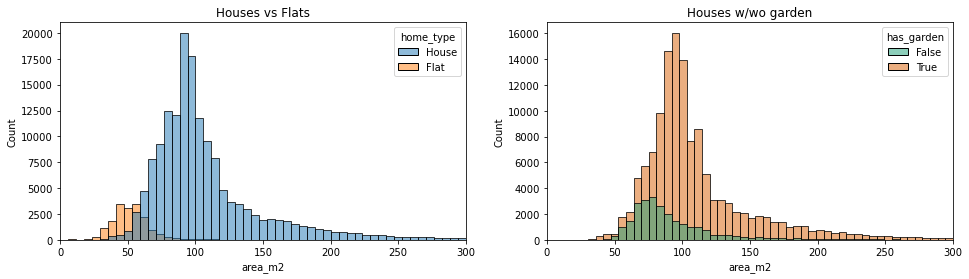

In [23]:
#Does area include garden for houses? Can't tell; seems unlikely but it would explain why has_garden fits -ve when area is included.

fig, axs = plt.subplots(1,2, figsize=(16,4))
sns.histplot(data=houses[(houses.home_type.isin(['House','Flat'])) & (houses.area_m2 <= 300)], x='area_m2', hue='home_type', ax=axs[0], bins=50)
axs[0].set_xlim(0,300)
axs[0].set_title('Houses vs Flats')

sns.histplot(data=houses[(houses.home_type=='House') & (houses.area_m2<=300)], x='area_m2', hue='has_garden', ax=axs[1], palette='Dark2', bins=50)
axs[1].set_xlim(0,300)
axs[1].set_title('Houses w/wo garden');

In [24]:
#Floors 3-9 are lower than 0-2 but probably skewed to cheaper tower blocks; 10+ may be more than <=9

houses[houses.home_type=='Flat'].groupby('flat_floor').agg({'type': len, 'area_m2': np.mean, 'value': np.mean, 'price_per_sq_m': np.mean})

,type,area_m2,value,price_per_sq_m
flat_floor,,,,
-1,22,85.753182,114204.545455,1332.633705
0,8013,51.559682,70426.712842,1383.099157
1,6594,54.388392,74214.513194,1389.732532
2,1976,51.403355,75571.609312,1505.493072
3,319,48.426364,72231.974922,1522.821920
4,128,48.343047,60957.031250,1294.206862
5,95,50.200000,54789.473684,1115.305675
6,90,50.355556,54361.111111,1099.870445
7,98,50.408163,55178.571429,1117.250969


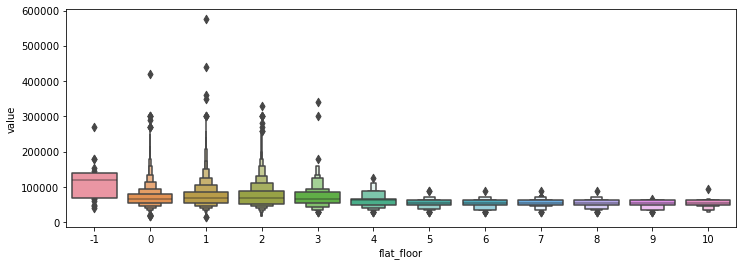

In [25]:
fig, ax = plt.subplots(1,1,figsize=(12,4))
sns.boxenplot(data=houses[houses.home_type=='Flat'], x='flat_floor', y='value', ax=ax);

In [26]:
#So far at least for the cheap flats, valuations don't depend on floor number

#houses[houses.postcode=='BT15 4BA'].groupby('flat_floor')[['area_m2','value']].mean()
#houses[houses.postcode=='BT6 0FQ'].groupby('flat_floor')[['area_m2','value']].mean()

In [27]:
#Postcode can affect price per sq m by at least factor ~4

tmp = houses.groupby('Postcode').agg({'type': len, 'area_m2': np.mean, 'value': np.mean, 'price_per_sq_m': np.mean}).sort_values('price_per_sq_m')
print(tmp[tmp.type >= 10].head(5))
print(tmp[tmp.type >= 10].tail(5))

          type     area_m2         value  price_per_sq_m
Postcode                                                
BT13 1EA    11  104.000000  39000.000000      375.000000
BT13 1DY    16  100.000000  37750.000000      380.437969
BT13 1DP    27   92.444444  35185.185185      382.020757
BT13 1JA    33  100.181818  38454.545455      384.848485
BT13 1DU    41   93.139268  36951.219512      396.784900
          type     area_m2         value  price_per_sq_m
Postcode                                                
BT15 4AN    36   35.305556  1.052778e+05     3025.312338
BT9 6NJ     18  352.228889  1.112778e+06     3157.893221
BT9 6NN     10  329.300000  1.047000e+06     3182.040302
BT9 6NL     16  384.641250  1.182188e+06     3206.299893
BT9 6NH     18  353.000000  1.146667e+06     3278.144870


In [28]:
# houses[houses.Postcode=='BT15 4BP'][['desc','area_m2','value']].sort_values('area_m2')   #Many 85m2, value 53k (some 56k) or 88m2 54k; one 98m2 is 59k; outb, garden, yard no effect
# #  e.g. no difference in data between 201251 (56k) and 201252 (53k)

# houses[houses.Postcode=='BT15 5GJ'][['desc','area_m2','value']].sort_values('area_m2')   #Flat g,1,2 floor doesn't matter; 
# #  two 'flat o g' are much cheaper than other larger flats, these one house converted into two flats
# #  two houses at 280k, one 175 with multiple outbuildings and one 164 with one ob; house 203 at 300k, one 196, 310k - no data to explain that, incl heating, subclass

# houses[houses.Postcode=='BT15 4JT'][['desc','area_m2','value']].sort_values('area_m2')   #flag g vs 1f doesn't matter

# houses[houses.Postcode=='BT15 4BA'][['desc','area_m2','value']].sort_values('area_m2').head(20)   #flag g-10f doesn't matter

# houses[houses.Postcode=='BT15 4FW'][['desc','area_m2','value']].sort_values('area_m2')   #one houses with outb adds 8k, or could be full vs half heating or bigger garden; many consistent with area

Price increases just slightly super-linearly with area for houses. A bit more super-linear for flats. Linear fit will be reasonably good. Flats could be two gradients with a break at 70m2; houses could have break at 110m2.

This means people do pay the same amount for each extra m2 for houses below 100m2 (which is about half of them) but pay a bit more per m2 beyond that. Makes sense because the total price is higher so relative increase may be similar, i.e. they pay an extra X% for each extra m2.

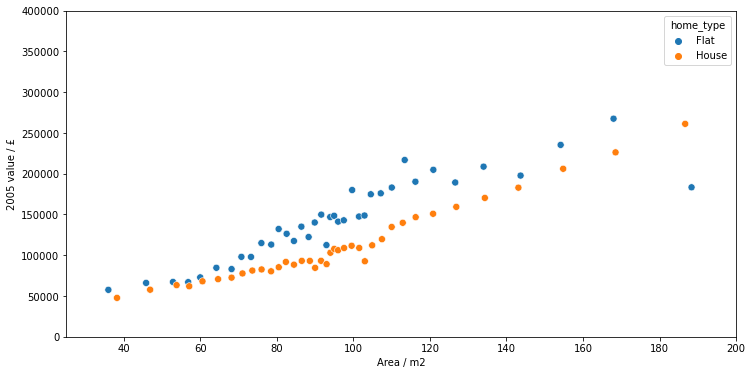

In [29]:
fig, ax = plt.subplots(1,1,figsize=(12,6))
sns.scatterplot(data=(houses
                      .query("home_type in ['Flat','House']")
                      .assign(area_binned = lambda df: pd.qcut(df.area_m2, 40))
                      .groupby(['area_binned','home_type'])[['area_m2','value']].mean()
                     ), 
              x='area_m2', y='value', s=50, hue='home_type')
ax.set_xlabel('Area / m2'); ax.set_ylabel('2005 value / £');
ax.set_ylim(0, 400000); ax.set_xlim(25, 200);

On log scale, the House line are straighter, which I think means people pay a steady extra X% for each extra m2, not an extra £X.

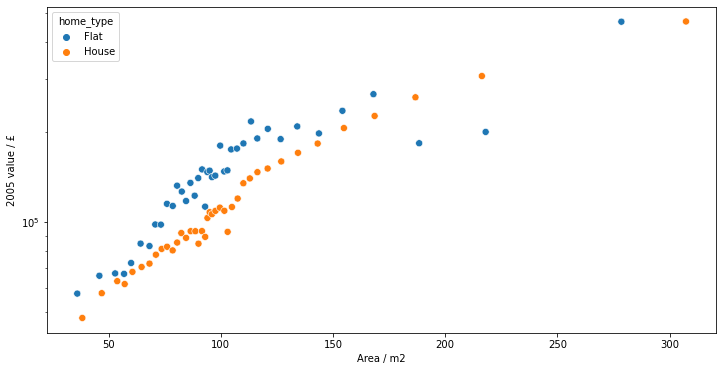

In [30]:
fig, ax = plt.subplots(1,1,figsize=(12,6))
sns.scatterplot(data=(houses
                      .query("home_type in ['Flat','House']")
                      .assign(area_binned = lambda df: pd.qcut(df.area_m2, 40))
                      .groupby(['area_binned','home_type'])[['area_m2','value']].mean()
                     ), 
              x='area_m2', y='value', s=50, hue='home_type')
ax.set_xlabel('Area / m2'); ax.set_ylabel('2005 value / £');
ax.set_yscale('log');
#ax.set_ylim(0, 400000); ax.set_xlim(25, 200);

As a result, price per sq m increases with size for flats after 70m2 and for houses after 100m2, so areas with bigger properties will tend to show higher ppsqm. 

Flats cost more per sq m than houses, but note that only 5% of flats are > 77m2 so points are noisy after that.

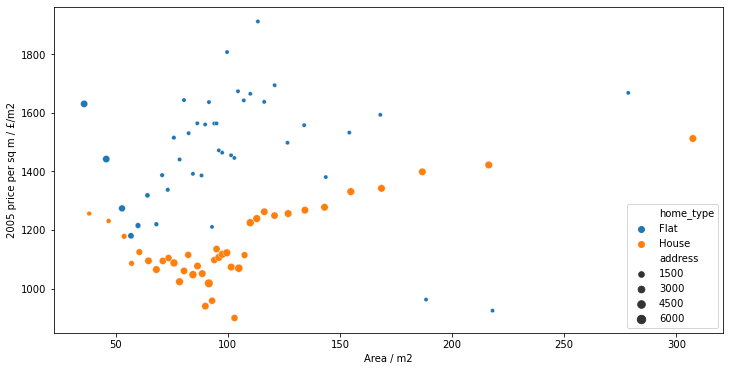

In [31]:
fig, ax = plt.subplots(1,1,figsize=(12,6))
sns.scatterplot(data=(houses
                      .query("home_type in ['Flat','House']")
                      .assign(area_binned = lambda df: pd.qcut(df.area_m2, 40))
                      .groupby(['area_binned','home_type']).agg({'area_m2': np.mean, 'price_per_sq_m': np.mean, 'address': len})
                     ), 
              x='area_m2', y='price_per_sq_m', size='address', hue='home_type')
ax.set_xlabel('Area / m2'); ax.set_ylabel('2005 price per sq m / £/m2')
ax.legend(loc='lower right');

## Fit model

Can't easily fit a model with 2000 postcode columns, but there is no problem with fitting in chunks, as long as shared terms get similar coefficients, which they should do.

In [21]:
from statsmodels.api import GLM, add_constant

In [22]:
houses_mod = houses.copy()
houses_mod['has_garage_01'] = houses_mod.has_garage.apply(lambda g: 1 if g=='Yes' else 0)
houses_mod['has_other_outbuilding_01'] = houses_mod.has_other_outbuilding.apply(lambda g: 1 if g=='Yes' else 0)
houses_mod['has_garden_01'] = houses_mod.has_garden.apply(lambda g: 1 if g else 0)
houses_mod['has_yard_01'] = houses_mod.has_yard.apply(lambda g: 1 if g else 0)
houses_mod = pd.concat([houses_mod, pd.get_dummies(houses_mod['home_type'], prefix='home_type')], axis=1)
houses_mod = pd.concat([houses_mod, pd.get_dummies(houses_mod['Postcode'], prefix='postcode')], axis=1)
postcode_cols = [c for c in houses_mod.columns if 'postcode_' in c]
postcode_has_10_rows = (houses_mod.Postcode.value_counts() >= 10)
postcode_cols = [c for c in postcode_cols if c.split('_')[1] in postcode_has_10_rows.index[np.where(postcode_has_10_rows)]]
print(f'Using {len(postcode_cols)} postcode terms with >= 10 rows')

Using 1445 postcode terms with >= 10 rows


In [23]:
#It may be important to include all terms to get meaningful coefs, as they are correlated.

houses_mod[['has_garden_01','has_garage_01','has_yard_01','has_other_outbuilding_01']].corr()

,has_garden_01,has_garage_01,has_yard_01,has_other_outbuilding_01
has_garden_01,1.000000,0.213917,-0.309946,0.079027
has_garage_01,0.213917,1.000000,-0.107797,-0.266022
has_yard_01,-0.309946,-0.107797,1.000000,-0.018541
has_other_outbuilding_01,0.079027,-0.266022,-0.018541,1.000000


In [24]:
glm1 = GLM(houses_mod['price_per_sq_m'], add_constant(houses_mod[['area_m2',
                                                                  'has_garage_01','has_garden_01','has_yard_01','has_other_outbuilding_01',
                                                                  'home_type_House','home_type_Flat'] + random.choices(postcode_cols, k=50)]))\
    .fit()

In [25]:
glm1.params.head(20)

const                       871.602077
area_m2                      -0.490009
has_garage_01               194.896178
has_garden_01               134.498145
has_yard_01                 184.160353
has_other_outbuilding_01      5.976799
home_type_House            -100.514302
home_type_Flat              341.424284
postcode_BT61 7EH          -214.891659
postcode_BT60 2NU           -13.112047
postcode_BT75 0PD          -140.605488
postcode_BT80 8JG            39.364537
postcode_BT66 6JR           114.748276
postcode_BT66 6JY           162.811677
postcode_BT66 6JR           114.748276
postcode_BT71 5NZ           -40.283663
postcode_BT70 2JU           -18.494627
postcode_BT19 1DZ           483.040375
postcode_BT62 2EX           112.107350
postcode_BT4 2AG            507.754026
dtype: float64

In [26]:
#Need to jumble up the postcodes to avoid fitting only one area at once
jumbled_postcode_cols = copy.copy(postcode_cols)
random.shuffle(jumbled_postcode_cols)

postcode_glms = []
for i in range(0,len(postcode_cols),500):
    postcode_cols_batch = jumbled_postcode_cols[i:min(i+500,len(postcode_cols))]
    postcodes_batch = [p.split('_')[1] for p in postcode_cols_batch]
    train_batch = houses_mod[houses_mod.Postcode.isin(postcodes_batch)]
    #Can leave out the unused postcode cols
    train_batch = train_batch[[c for c in houses_mod.columns if 'postcode_' not in c or c in postcode_cols_batch]]
    print(i, train_batch.shape)
    this_glm = GLM(train_batch['price_per_sq_m'], add_constant(train_batch[['area_m2',
                                                                            'has_garage_01','has_garden_01','has_yard_01','has_other_outbuilding_01',
                                                                            'home_type_House','home_type_Flat'] + postcode_cols_batch])).fit()
    postcode_glms.append(this_glm)

0 (10988, 524)
500 (10174, 524)
1000 (9520, 469)


In [29]:
#If using a constant, an arbitrary amount of House and Flat can go into const. 
#  The important thing is that const + House/Flat is consistent, e.g. 934 + (349, 583) = (1280, 1500) is similar to 1429 + (-73, 83) = (1350, 1500)

postcode_glms[0].params.head(12)

const                       1163.886182
area_m2                       -1.156954
has_garage_01                102.576143
has_garden_01                116.818698
has_yard_01                   63.816289
has_other_outbuilding_01      27.493864
home_type_House             -268.596629
home_type_Flat               -28.840391
postcode_BT94 2GT           -186.083828
postcode_BT93 5EZ           -182.484882
postcode_BT71 5PP            -16.511424
postcode_BT70 1NN            119.904849
dtype: float64

In [30]:
postcode_glms[2].params.head(12)

const                       870.218005
area_m2                      -1.187445
has_garage_01               109.385293
has_garden_01               128.187575
has_yard_01                  21.294143
has_other_outbuilding_01     30.777351
home_type_House              37.078090
home_type_Flat              269.176893
postcode_BT60 4AN           -11.263286
postcode_BT4 2BG            213.690019
postcode_BT70 3ET            57.623704
postcode_BT74 6PY           161.521876
dtype: float64

Chunk models may not be consistent enough. Could fit multiple times and average coefficients by postcode.

In [31]:
jumbled_postcode_cols = copy.copy(postcode_cols)
random.shuffle(jumbled_postcode_cols)

postcode_glms_b = []
for i in range(0,len(postcode_cols),500):
    postcode_cols_batch = jumbled_postcode_cols[i:min(i+500,len(postcode_cols))]
    postcodes_batch = [p.split('_')[1] for p in postcode_cols_batch]
    train_batch = houses_mod[houses_mod.Postcode.isin(postcodes_batch)]
    #Can leave out the unused postcode cols
    train_batch = train_batch[[c for c in houses_mod.columns if 'postcode_' not in c or c in postcode_cols_batch]]
    print(i, train_batch.shape)
    this_glm = GLM(train_batch['price_per_sq_m'], add_constant(train_batch[['area_m2',
                                                                            'has_garage_01','has_garden_01','has_yard_01','has_other_outbuilding_01',
                                                                            'home_type_House','home_type_Flat'] + postcode_cols_batch])).fit()
    postcode_glms_b.append(this_glm)

0 (11230, 524)
500 (10011, 524)
1000 (9441, 469)


In [32]:
#Results seem consistent to within ~£30/m2. Still would be sensible to take average of ~3 models.

res_1 = pd.concat([g.params for g in postcode_glms]).filter(like='postcode_').to_frame(name='coefficient')
res_2 = pd.concat([g.params for g in postcode_glms_b]).filter(like='postcode_').to_frame(name='coefficient')
for pc in random.choices(res_1.index, k=15):
    print(f'{pc}: coef_1 = {res_1.loc[pc].values[0]:.0f}, coef_2 = {res_2.loc[pc].values[0]:.0f}')

postcode_BT80 0ET: coef_1 = -210, coef_2 = -203
postcode_BT71 6JN: coef_1 = -20, coef_2 = -34
postcode_BT75 0QQ: coef_1 = -140, coef_2 = -151
postcode_BT70 3JE: coef_1 = 20, coef_2 = 30
postcode_BT62 3TD: coef_1 = 38, coef_2 = 45
postcode_BT60 4AG: coef_1 = -143, coef_2 = -132
postcode_BT70 3DY: coef_1 = -25, coef_2 = -22
postcode_BT80 8NN: coef_1 = 29, coef_2 = 37
postcode_BT92 0GA: coef_1 = -133, coef_2 = -144
postcode_BT60 3AY: coef_1 = 1, coef_2 = 8
postcode_BT66 7RH: coef_1 = -253, coef_2 = -246
postcode_BT71 6DU: coef_1 = -30, coef_2 = -32
postcode_BT15 4AU: coef_1 = 332, coef_2 = 333
postcode_BT70 2HD: coef_1 = -144, coef_2 = -147
postcode_BT5 6JR: coef_1 = 229, coef_2 = 255


In [22]:
pc_coefs = pd.concat([g.params for g in postcode_glms]).filter(like='postcode').to_frame(name='coef_1')\
    .join(pd.concat([g.params for g in postcode_glms_b]).filter(like='postcode').to_frame(name='coef_2'))
pc_coefs.head()

,coef_1,coef_2
postcode_BT94 5BA,-67.729621,-72.086098
postcode_BT68 4UE,-189.451692,-185.498320
postcode_BT94 2EG,0.221639,16.365204
postcode_BT71 6HN,-152.298905,-133.504845
postcode_BT71 6JH,-89.076074,-81.195489


In [78]:
(pd.concat([g.params for g in postcode_glms]).filter(regex='const|area|garage|garden|yard|outbuilding|home_type')
 .to_frame(name='value')
 .assign(coef = lambda df: df.index)
 .reset_index(drop=True)
 .groupby('coef', as_index=False).agg(value = ('value', np.mean), n=('value', len))
)

,coef,value,n
0,area_m2,-1.210645,3
1,const,1131.788252,3
2,has_garage_01,102.028515,3
3,has_garden_01,115.034045,3
4,has_other_outbuilding_01,27.928281,3
5,has_yard_01,45.329618,3
6,home_type_Flat,11.656908,3
7,home_type_House,-216.036720,3


Why negative coefficient on area_m2 - naturally ppsqm increases as area gets small, but the negative coefficient causes over-compensation (negative residuals) at high area, and will get worse if more extreme areas are entered.

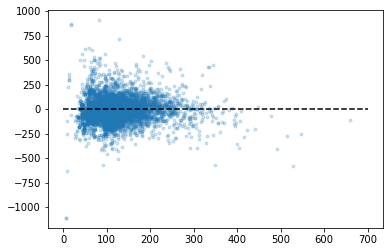

In [74]:
plt.plot(train_batch.area_m2, this_glm.fittedvalues-train_batch.price_per_sq_m, '.', alpha=0.2)
plt.plot([0,700],[0,0],'k--');

## Plots

In [318]:
def convert_price_to_colour(this_ppsqm, all_ppsqm):
    #colours = ['#8c510a','#d8b365','#f6e8c3',
    #           '#c7eae5','#5ab4ac','#01665e'][-1::-1]
    #breaks = np.nanpercentile(all_ppsqm, [i*100/len(colours) for i in range(len(colours)-1,0,-1)])
    #for br, col in zip(breaks, colours[:-1]):
    #    if this_ppsqm > br:
    #        return col
    #else:
    #    return colours[-1]
    breaks = np.nanpercentile(all_ppsqm, [i*100/10 for i in range(0,11)])
    whichbin = np.argmax(this_ppsqm <= np.array(breaks))
    cmap_ind = (whichbin/10 - 0.05)
    #whichbin/10 is 0.1 to 1.0; adjust to 0.05-0.95; then shrink to 0.14-0.86 to avoid plotting extreme colours
    #cmap_ind = (cmap_ind-0.5)*0.8 + 0.5
    #and adjust to avoid the middle ~white values - changes it to 0.14-0.46 and 0.54-0.86
    #cmap_ind = 0.14+0.8*(cmap_ind-0.14) if cmap_ind <= 0.5 else 1-0.8*(1-cmap_ind-0.14)-0.14
    #return cmap_ind#colors.to_hex(cm.get_cmap('BrBG', 10)(cmap_ind))  
    
    #Make 15 colours but don't use the edge 2s
    fifteen_map = cm.get_cmap('BrBG', 15)
    cols = [fifteen_map(x) for x in [2,3,4,5,6,7,8,9,10,11]]
    return colors.to_hex(cols[max(whichbin-1,0)])


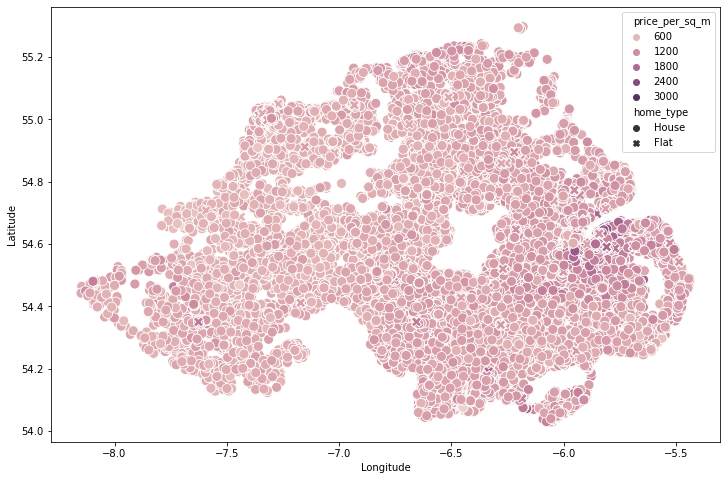

In [319]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=houses, x='Longitude', y='Latitude', hue='price_per_sq_m', style='home_type', s=100);

In [320]:
summ = houses.groupby('Postcode').agg(
    n = ('value', len),
    longitude = ('Longitude', np.max),
    latitude = ('Latitude', np.max),
    mean_val = ('value', np.mean),
    mean_size = ('area_m2', np.mean),
    mean_price_per_sq_m = ('price_per_sq_m', np.mean),
    sd_price_per_sq_m = ('price_per_sq_m', np.std),
    frac_houses = ('home_type', lambda h: np.mean(h=='House')),
    frac_w_garage = ('has_garage', lambda g: np.mean(g=='Yes')),
    frac_w_garden = ('has_garden', lambda g: np.mean(g))
)
summ.sort_values('mean_price_per_sq_m', ascending=False).head(8)

,n,longitude,latitude,mean_val,mean_size,mean_price_per_sq_m,sd_price_per_sq_m,frac_houses,frac_w_garage,frac_w_garden
Postcode,,,,,,,,,,
BT20 3RX,8,-5.688366,54.665322,1.331250e+05,41.625000,3218.135749,246.219712,0.0,0.0,0.0
BT20 3BH,12,-5.673061,54.662424,2.033333e+05,64.633333,3146.631162,80.128871,0.0,0.0,0.0
BT9 6NH,1,-5.963152,54.568915,7.000000e+05,235.000000,2978.723404,NaN,1.0,1.0,1.0
BT18 0AY,2,-5.815687,54.652717,9.100000e+05,322.800000,2824.463119,66.023042,1.0,0.5,1.0
BT18 0BU,2,-5.796324,54.660875,8.750000e+05,314.750000,2767.450683,378.232383,1.0,0.5,1.0
BT18 0AP,1,-5.822434,54.650278,1.800000e+05,67.000000,2686.567164,NaN,0.0,0.0,0.0
BT18 0ED,1,-5.801327,54.659510,1.000000e+06,384.310000,2602.066040,NaN,1.0,1.0,1.0
BT17 9JZ,5,-5.973855,54.546749,1.280000e+06,496.944000,2596.810395,168.065835,1.0,1.0,1.0


In [321]:
# #Save out
# (summ
#  .assign(popup_text = lambda df: df.apply(lambda row: f'<b>{row.name}</b><br/>{row.n:g} properties<br/>Mean value £{row.mean_val:,.0f}<br/>Mean £{row.mean_price_per_sq_m:,.0f}/m<sup>2</sup>', axis=1))
#  .assign(html_colour = lambda df: df.apply(lambda row: convert_price_to_colour(row.mean_price_per_sq_m, summ.mean_price_per_sq_m.values), axis=1))
#  [['n','longitude','latitude','mean_price_per_sq_m','html_colour','popup_text']]
#  .query("n >= 10")
#  .to_csv('ppsqm_nge10_simplemethod.csv', index=False)
# )

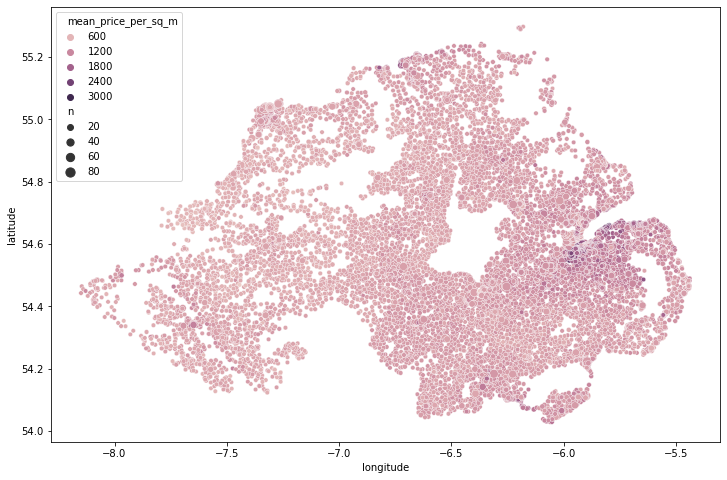

In [322]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=summ, x='longitude', y='latitude', size='n', hue='mean_price_per_sq_m', sizes=(20,100))
ax.ticklabel_format(useOffset=False);

In [323]:
summ.mean_price_per_sq_m.describe()  #7801 postcodes

count    15350.000000
mean       963.845394
std        260.098197
min        213.333333
25%        805.352036
50%        916.239650
75%       1048.847883
max       3218.135749
Name: mean_price_per_sq_m, dtype: float64

In [324]:
m = folium.Map(location=[54.60, -5.94], zoom_start=12, tiles='CartoDB Positron')  #OpenStreetMap, Stamen Watercolor/Terrain/Toner/Toner Background, CartoDB Positron/Dark_Matter

for i,row in summ[summ.n >= 10].iterrows():
    folium.Circle(
        [row.latitude, row.longitude], 
        #color = 'steelblue',
        #radius = 50*max(min((row.mean_price_per_sq_m - 450)/2000, 1), 0),
        color = convert_price_to_colour(row.mean_price_per_sq_m, summ.mean_price_per_sq_m.values),
        radius = 30,
        fill = True,
        popup=f'{row.name}: {row.n:g} properties<br/>Mean £{row.mean_val:,.0f}<br/>£{row.mean_price_per_sq_m:,.0f}/m<sup>2</sup>'
    ).add_to(m)

m

Plot model coefficients instead

In [98]:
coefs_df = pd.concat([g.params for g in postcode_glms]).filter(like='postcode_').to_frame(name='coefficient')
coefs_df.index = [p.split('_')[1] for p in coefs_df.index]
coefs_df = coefs_df.join(summ, how='inner')
print(f"Corr between the two methods = {coefs_df[['mean_price_per_sq_m','coefficient']].corr().iloc[0,1]:.2f}\n")

m = folium.Map(location=[54.63, -5.92], zoom_start=13, tiles='CartoDB Positron')  #OpenStreetMap, Stamen Watercolor/Terrain/Toner/Toner Background, CartoDB Positron/Dark_Matter

for i,row in coefs_df[coefs_df.n >= 10].iterrows():
    folium.Circle(
        [row.latitude, row.longitude], 
        color = convert_price_to_colour(row.coefficient, coefs_df.coefficient.values),
        radius = 30,
        fill = True,
        popup=f'{row.name}: {row.n:g} properties<br/>mean £{row.mean_val:,.0f}</br>£{row.mean_price_per_sq_m:,.0f}/m<sup>2</sup><br/>Coef = £{row.coefficient:+.2f}/m<sup>2</sup>'
    ).add_to(m)

m

Corr between the two methods = 0.98



In [150]:
summ.head()

,n,longitude,latitude,mean_val,mean_size,mean_price_per_sq_m,sd_price_per_sq_m,frac_houses,frac_w_garage,frac_w_garden
Postcode,,,,,,,,,,
BT1 1JQ,1,-5.933395,54.601691,43000.000000,101.940000,421.816755,NaN,1.0,0.0,0.0
BT1 2FL,3,-5.931866,54.605295,141666.666667,280.370000,809.492779,451.576797,1.0,0.0,0.0
BT1 2JA,3,-5.933274,54.603172,80000.000000,75.333333,1062.271062,7.930636,1.0,0.0,0.0
BT1 2JE,8,-5.933577,54.603599,82812.500000,80.875000,1024.553888,15.166532,1.0,0.0,0.0
BT1 2JF,1,-5.931668,54.604016,95000.000000,131.800000,720.789074,NaN,0.0,0.0,0.0




## Other data

In [3]:
ghouses = geopandas.GeoDataFrame(houses, geometry=geopandas.points_from_xy(houses.Longitude, houses.Latitude)).set_crs("EPSG:4326") 
ghouses.head(2)

,address,postcode,type,desc,value,area_m2,has_garage,Postcode,Latitude,Longitude,LSOA Code,geometry
id,,,,,,,,,,,,
35000,"25 ChurchView,Borough of Charlemont,Blackwater...",BT71 7SZ,Domestic,house garden,80000.0,86.0,No,BT71 7SZ,54.441272,-6.684948,95CC05W1,POINT (-6.68495 54.44127)
34976,"1 ChurchView,Borough of Charlemont,Blackwatert...",BT71 7SZ,Domestic,house garden,80000.0,86.0,No,BT71 7SZ,54.441272,-6.684948,95CC05W1,POINT (-6.68495 54.44127)


### Price changes 2005 to 2022

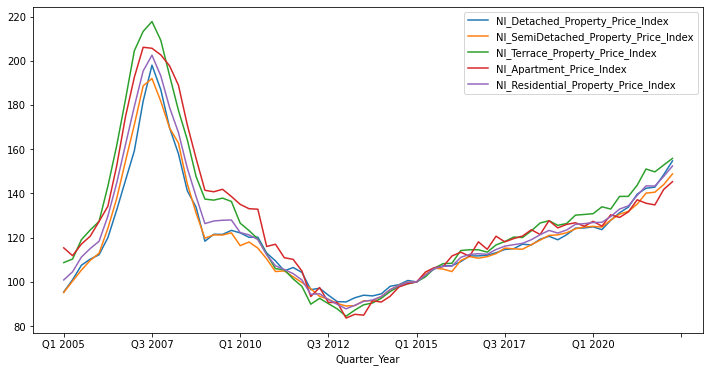

In [4]:
price_change_nw = pd.read_csv('ni-hpi-by-property-type-q1-2005---q2-2022.csv').set_index('Quarter_Year')
price_change_nw.plot(figsize=(12,6));

In [5]:
price_change_2005_2022_nw = price_change_nw.loc['Q1 2022']['NI_Residential_Property_Price_Index']/price_change_nw.loc['Q1 2005']['NI_Residential_Property_Price_Index']

houses['value_2022_by_nw'] = houses.value*price_change_2005_2022_nw

In [6]:
price_change_lgd = pd.read_csv('standardised-price-and-index-by-lgd-q1-2005---q2-2022.csv').set_index('Quarter_Year')
price_changes_2005_2022_lgd = price_change_lgd.loc['Q1 2022'] / price_change_lgd.loc['Q1 2005']
price_changes_2005_2022_lgd = price_changes_2005_2022_lgd.loc[[c for c in price_changes_2005_2022_lgd.index if '_HPI' in c]]
price_changes_2005_2022_lgd.index = [c[:-4].replace('_',' ').replace('Armagh City','Armagh City,').replace('Newry','Newry,') for c in price_changes_2005_2022_lgd.index]
price_changes_2005_2022_lgd.index.name = 'LGD'
price_changes_2005_2022_lgd.sort_values()

LGD
Mid Ulster                              1.381582
Mid and East Antrim                     1.431735
Ards and North Down                     1.432066
Fermanagh and Omagh                     1.442372
Antrim and Newtownabbey                 1.445456
Armagh City, Banbridge and Craigavon    1.445600
Belfast                                 1.446371
Lisburn and Castlereagh                 1.463858
Causeway Coast and Glens                1.512393
Derry City and Strabane                 1.537278
Newry, Mourne and Down                  1.548029
dtype: float64

Some variation in price rises between LGDs: Newry and Derry have risen relative to Mid Ulster.

In [7]:
lgd_geom = geopandas.read_file('LAD_MAY_2022_UK_BSC_V3/').to_crs("EPSG:4326")   #convert from something to lat lon geometry
lgd_geom.head()

,OBJECTID,LAD22CD,LAD22NM,BNG_E,BNG_N,LONG,LAT,GlobalID,SHAPE_Leng,SHAPE_Area,geometry
0,1,E06000001,Hartlepool,447160,531474,-1.27018,54.676140,{73D18662-52D0-49E2-8C9D-481BBFB9813B},57117.178231,9.443438e+07,"MULTIPOLYGON (((-1.24194 54.72272, -1.24252 54..."
1,2,E06000002,Middlesbrough,451141,516887,-1.21099,54.544670,{84D952B7-FC7D-4B5E-B853-8010295CA367},40207.239894,5.420722e+07,"MULTIPOLYGON (((-1.23126 54.58607, -1.22901 54..."
2,3,E06000003,Redcar and Cleveland,464361,519597,-1.00608,54.567520,{1284EA8B-98C1-4E8F-83A0-7965F1A233A8},87040.980106,2.444361e+08,"POLYGON ((-1.11881 54.62886, -1.08462 54.62040..."
3,4,E06000004,Stockton-on-Tees,444940,518183,-1.30664,54.556911,{0D5E9D09-3182-4FA2-8B07-0ABC352B7058},96655.935789,2.047012e+08,"MULTIPOLYGON (((-1.20074 54.62303, -1.20525 54..."
4,5,E06000005,Darlington,428029,515648,-1.56835,54.535339,{9F2CC3DA-885B-4209-9BFD-33D666E6A7F9},97912.519659,1.976101e+08,"POLYGON ((-1.64163 54.61937, -1.63324 54.61613..."


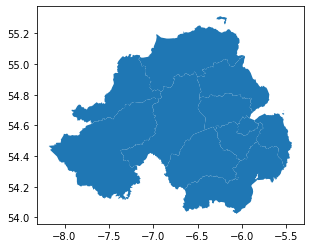

In [8]:
lgd_geom[lgd_geom.LAD22CD.str[0]=='N'].plot();

In [9]:
ghouses[['address','postcode','value','geometry']].sjoin(lgd_geom[['LAD22NM','geometry']], how='left').LAD22NM.value_counts(dropna=False)

Mid Ulster                              21499
Fermanagh and Omagh                      9775
Armagh City, Banbridge and Craigavon     9206
Belfast                                  4739
Ards and North Down                       298
Newry, Mourne and Down                    211
Lisburn and Castlereagh                   105
NaN                                        14
Name: LAD22NM, dtype: int64

In [10]:
# tmp = (ghouses[['address','postcode','value','geometry']]
#     .assign(id_tmp = lambda df: df.index)
#     .sjoin(lgd_geom[['LAD22NM','geometry']], how='left')
#     .merge(price_changes_2005_2022_lgd.to_frame(name='value_factor_by_lgd'), left_on='LAD22NM', right_on='LGD', how='left')
# )
# tmp[pd.isnull(tmp.LAD22NM)]

In [11]:
#Join on the 2022 value calculated via LGD

houses = houses.join(
    ghouses[['address','postcode','value','geometry']]
    .assign(id_tmp = lambda df: df.index)
    .sjoin(lgd_geom[['LAD22NM','geometry']], how='inner')
    .merge(price_changes_2005_2022_lgd.to_frame(name='value_factor_by_lgd'), left_on='LAD22NM', right_on='LGD', how='left')
    .rename(columns={'LAD22NM': 'lgd'})
    .set_index('id_tmp').rename_axis('id')
    .assign(value_2022_by_lgd = lambda df: df['value']*df['value_factor_by_lgd'])
    [['lgd','value_2022_by_lgd']],
    how='left'
)

In [12]:
houses[['value','value_2022_by_lgd','value_2022_by_nw']].sample(5)

,value,value_2022_by_lgd,value_2022_by_nw
id,,,
306234,110000.0,159100.813385,161029.199266
3311,40000.0,57824.006767,58556.072460
325312,185000.0,255592.702378,270821.835129
345790,57000.0,82215.206569,83442.403256
324202,165000.0,227961.058878,241543.798899


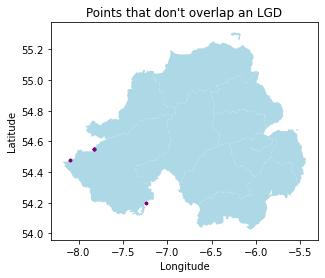

In [13]:
fig, ax = plt.subplots(1,1,figsize=(8,4))
lgd_geom[lgd_geom.LAD22CD.str[0]=='N'].plot(ax=ax, color='lightblue');
houses[houses.lgd.isnull()].plot.scatter(x='Longitude',y='Latitude', title='Points that don\'t overlap an LGD', s=6, c='purple', ax=ax);

Find nearest short postcodes to each one

In [14]:
short_postcodes = (ghouses
                   .assign(postcode_short = lambda df: df.Postcode.apply(lambda s: s.split(' ')[0]))
                   .groupby('postcode_short', as_index=False)[['Longitude','Latitude']].mean()
                   .assign(dum = 1)
                  )
(short_postcodes.merge(short_postcodes, on='dum', suffixes=['_a','_b'])
 .assign(distance_degrees = lambda df: df.apply(lambda row: ((row['Longitude_a']-row['Longitude_b'])**2 + (row['Latitude_a']-row['Latitude_b'])**2)**0.5, axis=1))
 .query('postcode_short_a != postcode_short_b')
 .sort_values('distance_degrees')
 .groupby('postcode_short_a', as_index=False)
 .agg(nearest_pcs_1 = ('postcode_short_b', lambda p: p[0:1]),
      nearest_pcs_2 = ('postcode_short_b', lambda p: p[1:2]),
      nearest_pcs_3 = ('postcode_short_b', lambda p: p[2:3]),
      nearest_pcs_4 = ('postcode_short_b', lambda p: p[3:4]),
      nearest_pcs_5 = ('postcode_short_b', lambda p: p[4:5]))
).head(10)

,postcode_short_a,nearest_pcs_1,nearest_pcs_2,nearest_pcs_3,nearest_pcs_4,nearest_pcs_5
0,BT10,BT17,BT11,BT12,BT9,BT13
1,BT11,BT10,BT17,BT12,BT13,BT9
2,BT12,BT13,BT14,BT9,BT2,BT7
3,BT13,BT14,BT12,BT9,BT15,BT2
4,BT14,BT13,BT12,BT15,BT2,BT9
5,BT15,BT36,BT14,BT2,BT13,BT12
6,BT16,BT18,BT4,BT5,BT23,BT6
7,BT17,BT10,BT11,BT9,BT12,BT13
8,BT18,BT16,BT4,BT5,BT6,BT36
9,BT19,BT20,BT23,BT21,BT18,BT16


And nearest short postcodes to each long one

In [44]:
ghouses.drop_duplicates(subset=['Postcode']).shape

(5933, 12)

In [46]:
(ghouses.drop_duplicates(subset=['Postcode']).assign(dum = 1).merge(short_postcodes, on='dum', suffixes=['_a','_b'])
 .assign(distance_degrees = lambda df: df.apply(lambda row: ((row['Longitude_a']-row['Longitude_b'])**2 + (row['Latitude_a']-row['Latitude_b'])**2)**0.5, axis=1))
 .rename(columns={'postcode_short': 'postcode_short_b'})
 .assign(postcode_short_a = lambda df: df.Postcode.apply(lambda s: s.split(' ')[0]))
 .query('postcode_short_a != postcode_short_b')
 .sort_values('distance_degrees')
 .groupby('Postcode', as_index=False)
 .agg(nearest_pcs_1 = ('postcode_short_b', lambda p: p[0:1]),
      nearest_pcs_2 = ('postcode_short_b', lambda p: p[1:2]),
      nearest_pcs_3 = ('postcode_short_b', lambda p: p[2:3]),
      nearest_pcs_4 = ('postcode_short_b', lambda p: p[3:4]),
      nearest_pcs_5 = ('postcode_short_b', lambda p: p[4:5]))
).sample(10)

,Postcode,nearest_pcs_1,nearest_pcs_2,nearest_pcs_3,nearest_pcs_4,nearest_pcs_5
808,BT5 6EP,BT4,BT6,BT7,BT2,BT8
1271,BT61 7NB,BT60,BT71,BT68,BT62,BT63
2937,BT71 6SS,BT61,BT60,BT62,BT68,BT80
5163,BT93 3FU,BT74,BT94,BT92,BT78,BT75
4728,BT92 7JE,BT75,BT76,BT77,BT78,BT94
3012,BT71 7HG,BT61,BT70,BT68,BT80,BT60
382,BT23 8NE,BT19,BT20,BT16,BT18,BT21
599,BT4 3EU,BT5,BT6,BT7,BT2,BT8
3199,BT74 4FG,BT94,BT92,BT75,BT78,BT93
1720,BT67 9DW,BT66,BT63,BT25,BT62,BT35


### Parks 

Use geopandas to join by coords and find how many parks within some distance of the house's postcode coord.

In [30]:
# parks = pd.read_csv('parksdata.csv')
# parks.head()

In [31]:
# gparks = geopandas.GeoDataFrame(parks, geometry=geopandas.points_from_xy(parks.LONGITUDE, parks.LATITUDE))
# gparks['dum'] = 0
# gparks.head()

In [32]:
# gparks.plot()

In [33]:
# ghouses['parks_within_pt01deg'] = ghouses.geometry.apply(lambda g: sum(gparks.geometry.distance(g) < 0.01))
# ghouses['parks_within_pt01deg'].plot.hist()

In [34]:
# ghouses.groupby('parks_within_pt01deg').value.mean()

### Listed buildings

In [22]:
# listed = geopandas.read_file('Listed_Buildings_Sept22')

In [35]:
# listed.head()

In [36]:
# listed.head(100).plot('Council', legend=True)

In [37]:
#Geometry units for listed are different

#Takes ~2 minutes for 2000 ghouses; may be impractical for full ghouses

#ghouses['listeds_within_pt01deg'] = ghouses.geometry.apply(lambda g: sum(listed.geometry.distance(g) < 0.01))
#ghouses['listeds_within_pt01deg'].plot.hist()

### Replot for 2022

In [39]:
summ_2022 = houses.groupby('Postcode').agg(
    n = ('value', len),
    longitude = ('Longitude', np.max),
    latitude = ('Latitude', np.max),
    mean_val = ('value_2022_by_lgd', np.mean),
    mean_size = ('area_m2', np.mean),
    frac_houses = ('home_type', lambda h: np.mean(h=='House')),
    frac_w_garage = ('has_garage', lambda g: np.mean(g=='Yes')),
    frac_w_garden = ('has_garden', lambda g: np.mean(g))
)
summ_2022['mean_price_per_sq_m'] = summ_2022['mean_val'] / summ_2022['mean_size']
summ_2022.sort_values('mean_price_per_sq_m', ascending=False).head(8)


,n,longitude,latitude,mean_val,mean_size,frac_houses,frac_w_garage,frac_w_garden,mean_price_per_sq_m
Postcode,,,,,,,,,
BT9 5BU,1,-5.940148,54.575840,3.615928e+05,68.000000,1.000000,1.000000,1.000000,5317.540554
BT9 6NH,18,-5.963152,54.568915,1.658505e+06,353.000000,1.000000,0.611111,0.944444,4698.315718
BT9 5PA,1,-5.955096,54.556560,3.051843e+06,658.470000,1.000000,0.000000,0.000000,4634.748546
BT9 6NN,10,-5.951642,54.565325,1.514350e+06,329.300000,1.000000,0.800000,0.900000,4598.695625
BT9 6NJ,18,-5.958668,54.567977,1.609490e+06,352.228889,0.888889,0.722222,0.833333,4569.442179
BT18 0ED,2,-5.801327,54.659510,9.487435e+05,210.000000,1.000000,1.000000,1.000000,4517.826313
BT18 0AY,3,-5.815687,54.652717,1.432066e+06,317.620000,0.666667,1.000000,0.666667,4508.739057
BT9 6NL,16,-5.955323,54.565917,1.709882e+06,384.641250,1.000000,0.812500,0.875000,4445.393605


In [128]:
m = folium.Map(location=[54.60, -5.92], zoom_start=12, tiles='CartoDB Positron')  #OpenStreetMap, Stamen Watercolor/Terrain/Toner/Toner Background, CartoDB Positron/Dark_Matter

for i,row in summ_2022[summ_2022.n >= 10].iterrows():
    folium.Circle(
        [row.latitude, row.longitude], 
        #color = 'steelblue',
        #radius = 50*max(min((row.mean_price_per_sq_m - 450)/2000, 1), 0),
        color = convert_price_to_colour(row.mean_price_per_sq_m, summ_2022.mean_price_per_sq_m.values),
        radius = 30,
        fill = True,
        popup=f'{row.n:g} properties<br/>mean £{row.mean_val:.0f}<br/>£{row.mean_price_per_sq_m:.0f}/m<sup>2</sup>'
    ).add_to(m)

#Parks are only Belfast so not much use
#for i,row in parks.iterrows():
#    folium.Marker([row.LATITUDE, row.LONGITUDE], popup=f'Park: {row.NAME}', icon=folium.Icon(color='lightgreen', prefix='fa', icon='tree')).add_to(m)

#m.add_child(folium.LatLngPopup())
    
m

Average postcodes geographically and plot fewer bigger circles to be visible at nw level. Quick way is to split into 50x50 lon,lat boxes. qcut is nice because it gives more detail in Belfast.

In [56]:
def summarise_postcodes_in_box(postcodes):
    deduped_postcodes = np.sort(np.unique(postcodes))
    if len(deduped_postcodes) <= 3:
        return ', '.join(deduped_postcodes)
    else:
        return ', '.join(deduped_postcodes[:3]) + ', and more'

summ_50x50 = (houses
 .assign(lon_box = lambda df: pd.qcut(df.Longitude, 50),
         lat_box = lambda df: pd.qcut(df.Latitude, 50))
 .groupby(['lon_box','lat_box'])
 .agg(
     n = ('address', len),
     n_postcodes = ('Postcode', lambda x: len(np.unique(x))),
     postcodes = ('Postcode', summarise_postcodes_in_box),
     longitude = ('Longitude', np.mean),
     latitude = ('Latitude', np.mean),
     mean_size = ('area_m2', np.mean),
     mean_val = ('value_2022_by_lgd', np.mean)
 )
)
summ_50x50['mean_price_per_sq_m'] = summ_50x50['mean_val'] / summ_50x50['mean_size']

In [63]:
# #Save out
# (summ_50x50
#  .assign(popup_text = lambda df: df.apply(lambda row: f'{row.n:g} properties<br/>Mean value £{row.mean_val:,.0f}<br/>Mean size {row.mean_size:.0f}m<sup>2</sup><br/>Mean £{row.mean_price_per_sq_m:,.0f}/m<sup>2</sup>', axis=1))
#  .assign(html_colour = lambda df: df.apply(lambda row: convert_price_to_colour(row.mean_price_per_sq_m, summ_50x50.mean_price_per_sq_m.values), axis=1))
#  [['n','longitude','latitude','postcodes','mean_price_per_sq_m','popup_text','html_colour']]
#  .query("n >= 10")
#  .to_csv('ppsqm_nge10_50x50simplemethod.csv', index=False)
# )

In [99]:
m = folium.Map(location=[54.60, -5.92], zoom_start=12, tiles='CartoDB Positron')  #OpenStreetMap, Stamen Watercolor/Terrain/Toner/Toner Background, CartoDB Positron/Dark_Matter

for i,row in summ_50x50[(summ_50x50.n >= 10)].iterrows():
    folium.Circle(
        [row.latitude, row.longitude], 
        color = convert_price_to_colour(row.mean_price_per_sq_m, summ_50x50.mean_price_per_sq_m.values),
        radius = 60,
        fill = True,
        popup=f'{row.n:g} properties<br/>Mean value £{row.mean_val:.0f}<br/>Mean £{row.mean_price_per_sq_m:.0f}/m<sup>2</sup>'
    ).add_to(m)
    
m

Average by LSOA and save as geojson

In [127]:
#Trial and error showed the ODNI file uses northing, easting format EPSG:29902 (TM65 / Irish Grid) or 29903 (TM75 / Irish Grid)
#https://epsg.io/transform#s_srs=29902&t_srs=4326&x=234276.5625000&y=397735.8438000

soas = geopandas.read_file('soa2001_ODNI.json').set_crs('EPSG:29902', allow_override=True).to_crs('EPSG:4326')

In [135]:
#soas['val'] = np.random.randint(0,10, size=soas.shape[0])

summ_soas = (houses
             .groupby('LSOA Code', as_index=False)
             .agg(
                 n = ('address', len),
                 n_postcodes = ('Postcode', lambda x: len(np.unique(x))),
                 postcodes = ('Postcode', summarise_postcodes_in_box),
                 longitude = ('Longitude', np.mean),
                 latitude = ('Latitude', np.mean),
                 mean_size = ('area_m2', np.mean),
                 mean_val = ('value_2022_by_lgd', np.mean)
             )
            )
summ_soas['mean_price_per_sq_m'] = summ_soas['mean_val'] / summ_soas['mean_size']
summ_soas['html_colour'] = summ_soas.apply(lambda row: convert_price_to_colour(row.mean_price_per_sq_m, summ_soas.mean_price_per_sq_m.values), axis=1)
summ_soas = geopandas.GeoDataFrame(summ_soas.merge(soas, left_on='LSOA Code', right_on='SOA_CODE', how='inner'))
summ_soas

,LSOA Code,n,n_postcodes,postcodes,longitude,latitude,mean_size,mean_val,mean_price_per_sq_m,html_colour,SOA_CODE,SOA_LABEL,geometry
0,95BB01S1,6,3,"BT23 5XH, BT23 6JN, BT23 6NB",-5.797991,54.498823,163.833333,311474.289580,1901.165552,#46a39a,95BB01S1,Ballygowan_1,"POLYGON ((-5.79534 54.50974, -5.79418 54.50897..."
1,95BB01S2,66,13,"BT23 5TD, BT23 5TH, BT23 5TJ, and more",-5.795476,54.502358,133.736667,220559.815645,1649.209758,#98d7cd,95BB01S2,Ballygowan_2,"POLYGON ((-5.78187 54.50822, -5.78192 54.50813..."
2,95BB02W1,939,50,"BT16 1UF, BT23 4NF, BT23 4NG, and more",-5.710132,54.587748,94.911363,145263.162675,1530.513922,#e7cf94,95BB02W1,Ballyrainey,"POLYGON ((-5.72936 54.59002, -5.72903 54.58999..."
3,95BB03S1,1,1,BT22 2PJ,-5.485980,54.545011,105.000000,179008.212402,1704.840118,#98d7cd,95BB03S1,Ballywalter_1,"POLYGON ((-5.48546 54.54822, -5.48546 54.54821..."
4,95BB03S2,146,18,"BT22 1BH, BT22 1BQ, BT22 2NE, and more",-5.518362,54.525479,114.863699,171971.337846,1497.177436,#e7cf94,95BB03S2,Ballywalter_2,"POLYGON ((-5.51388 54.54684, -5.51391 54.54681..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
364,95XX22W1,1041,42,"BT20 3EN, BT20 3EP, BT20 3ER, and more",-5.679848,54.650790,96.947137,149603.405178,1543.144122,#e7cf94,95XX22W1,Rathgael,"POLYGON ((-5.67519 54.65658, -5.67518 54.65657..."
365,95XX23W1,1118,38,"BT20 3JA, BT20 3JB, BT20 3JD, and more",-5.686538,54.653555,82.918086,127521.095396,1537.916536,#e7cf94,95XX23W1,Silverstream,"POLYGON ((-5.68740 54.65658, -5.68729 54.65656..."
366,95XX24S1,455,21,"BT19 1BB, BT19 1BD, BT19 1BJ, and more",-5.708183,54.656465,111.606220,194804.998654,1745.467224,#98d7cd,95XX24S1,Springhill_1,"POLYGON ((-5.70326 54.66063, -5.70326 54.66060..."
367,95XX24S2,676,29,"BT19 1AS, BT19 1BA, BT19 1BG, and more",-5.702170,54.657150,100.763343,168061.171721,1667.880068,#98d7cd,95XX24S2,Springhill_2,"POLYGON ((-5.69617 54.66022, -5.69617 54.66022..."


In [136]:
summ_soas.to_file('out.json', driver='GeoJSON')

In [155]:
(houses[houses['LSOA Code']=='95GG35S1'][['value_2022_by_lgd','area_m2']]
 .assign(ppsqm = lambda df: df.value_2022_by_lgd/df.area_m2)
).value_2022_by_lgd.mean()

103859.73253764695

In [147]:
summ_soas[summ_soas.SOA_LABEL=='New Lodge_1']

,LSOA Code,n,n_postcodes,postcodes,longitude,latitude,mean_size,mean_val,mean_price_per_sq_m,html_colour,SOA_CODE,SOA_LABEL,geometry
168,95GG35S1,534,26,"BT1 2FL, BT1 2JA, BT1 2JE, and more",-5.931113,54.607738,77.996404,103859.732538,1331.596414,#c68f3f,95GG35S1,New Lodge_1,"POLYGON ((-5.93153 54.60211, -5.93155 54.60208..."


In [137]:
summ_soas.html_colour.value_counts()

#46a39a    74
#c68f3f    74
#98d7cd    73
#e7cf94    73
#076b63    37
#92560e    36
#543005     2
Name: html_colour, dtype: int64